In [3]:
import os 
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random

import splitfolders


import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator

from keras.models import Sequential
from keras.layers import Dense,Conv2D,Dropout,Flatten,MaxPooling2D, BatchNormalization,Input,concatenate
from keras.callbacks import EarlyStopping,ReduceLROnPlateau
from keras.utils import plot_model

from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.optimizers import Adam


In [4]:
# Path where our data is located
base_path = "C:/Users/Dell/Downloads/ASLresize/"

# Dictionary to save our 29 classes
categories = {  0: "A",
                1: "B",
                2: "C",
                3: "D",
                4: "E",
                5: "F",
                6: "G",
                7: "H",
                8: "I",
                9: "J",
                10: "K",
                11: "L",
                12: "M",
                13: "N",
                14: "O",
                15: "P",
                16: "Q",
                17: "R",
                18: "S",
                19: "T",
                20: "U",
                21: "V",
                22: "W",
                23: "X",
                24: "Y",
                25: "Z",
                26: "del",
                27: "nothing",
                28: "space",
            }

def add_class_name_prefix(df, col_name):
    df[col_name]
    return df


# list conatining all the filenames in the dataset
filenames_list = []
# list to store the corresponding category, note that each folder of the dataset has one class of data
categories_list = []

for category in categories:
    filenames = os.listdir(base_path + categories[category])
    filenames_list = filenames_list + filenames
    categories_list = categories_list + [category] * len(filenames)

df = pd.DataFrame({"filename": filenames_list, "category": categories_list})
df = add_class_name_prefix(df, "filename")

# Shuffle the dataframe
df = df.sample(frac=1).reset_index(drop=True)

In [3]:
df


,filename,category
0,D2111.jpg,3
1,D2209.jpg,3
2,L2903.jpg,11
3,D2449.jpg,3
4,M2197.jpg,12
...,...,...
86995,H1116.jpg,7
86996,E914.jpg,4
86997,C90.jpg,2
86998,G1772.jpg,9


In [4]:
df.shape

(87000, 2)

In [5]:
print("number of elements = ", len(df))


number of elements =  87000


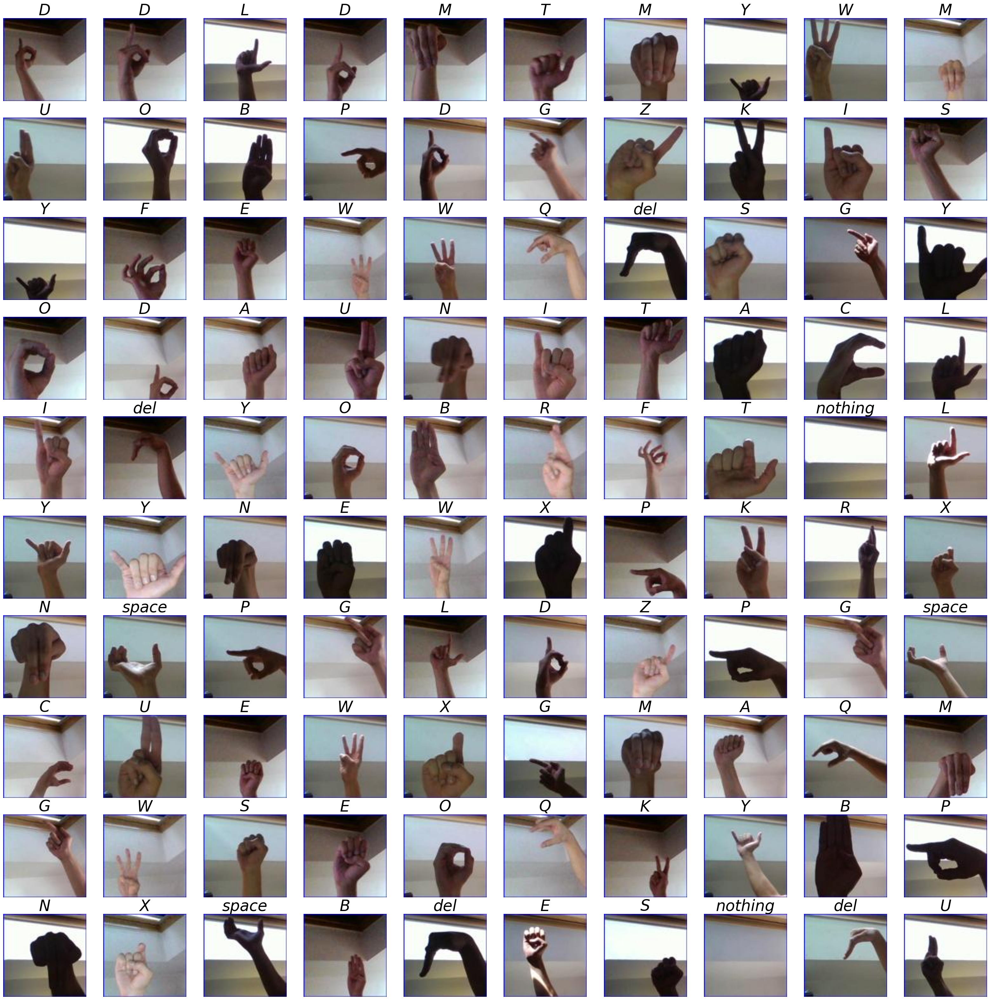

In [6]:
plt.figure(figsize=(40,40))

for i in range(100):
    path = ""
    path = os.path.join(base_path, categories[df.category[i]], df.filename[i])
    img = plt.imread(path)
    plt.subplot(10,10, i + 1)
    plt.imshow(img)
    plt.title(categories[df.category[i]],fontsize=35,fontstyle='italic')
    plt.axis("off")

In [6]:
splitfolders.ratio('C:/Users/Dell/Downloads/ASLresize/',output='C:/Users/Dell/Downloads/ASLdatasets/', seed=1333, ratio=(0.8,0.1,0.1))

Copying files: 87000 files [09:44, 148.92 files/s]


In [5]:
datagen = ImageDataGenerator(rescale=1.0 / 255,
                             rotation_range=15,
                             width_shift_range=0.1,
                             height_shift_range=0.1,
                             shear_range=0.1,
                             zoom_range=0.1,
                             horizontal_flip=True,
                             fill_mode='nearest')


In [6]:
train_path = 'C:/Users/Dell/Downloads/ASLdatasets/train/'
val_path = 'C:/Users/Dell/Downloads/ASLdatasets/val/'
test_path = 'C:/Users/Dell/Downloads/ASLdatasets/test/'

# Define hyperparameters and parameters
batch_size = 32
image_size = 100
img_channel = 3
num_classes = 36
learning_rate = 0.05

In [7]:
train_data = datagen.flow_from_directory(directory=train_path,
                                         target_size=(image_size, image_size),
                                         batch_size=batch_size,
                                         class_mode='categorical')

val_data = datagen.flow_from_directory(directory=val_path,
                                       target_size=(image_size, image_size),
                                       batch_size=batch_size,
                                       class_mode='categorical')

test_data = datagen.flow_from_directory(directory=test_path,
                                        target_size=(image_size, image_size),
                                        batch_size=batch_size,
                                        class_mode='categorical',
                                        shuffle=False)

Found 69600 images belonging to 29 classes.
Found 8700 images belonging to 29 classes.
Found 8700 images belonging to 29 classes.


In [11]:
# Define the CNN model
model = Sequential()
model.add(Conv2D(64, 3, activation='relu', padding='same', input_shape=(image_size, image_size, img_channel)))
model.add(Conv2D(64, 3, activation='relu', padding='same'))
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.2))

model.add(Conv2D(128, 3, activation='relu', padding='same'))
model.add(Conv2D(128, 3, activation='relu', padding='same'))
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.3))

model.add(Conv2D(256, 3, activation='relu', padding='same'))
model.add(Conv2D(256, 3, activation='relu', padding='same'))
model.add(MaxPooling2D(padding='same'))
model.add(BatchNormalization())
model.add(Dropout(0.4))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 100, 100, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 100, 100, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2  (None, 50, 50, 64)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 50, 50, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 50, 50, 128)       73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 50, 50, 128)       147584    
                                                        

In [12]:
# optimizer = Adam(learning_rate=learning_rate)
# model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [13]:
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.01, patience=4, restore_best_weights=True, verbose=1)
reduce_learning_rate = ReduceLROnPlateau(monitor='val_accuracy', patience=3, factor=0.6, verbose=1)


In [14]:
history = model.fit(train_data,
                    validation_data=val_data,
                    epochs=10,
                    callbacks=[early_stopping, reduce_learning_rate],
                    verbose=1)

Epoch 1/10
2175/2175 [==============================] - 7511s 3s/step - loss: 2.9576 - accuracy: 0.1383 - val_loss: 2.2649 - val_accuracy: 0.2852 - lr: 0.0500
Epoch 2/10
2175/2175 [==============================] - 7344s 3s/step - loss: 1.6336 - accuracy: 0.4572 - val_loss: 0.9975 - val_accuracy: 0.6413 - lr: 0.0500
Epoch 3/10
2175/2175 [==============================] - 6435s 3s/step - loss: 0.9558 - accuracy: 0.6679 - val_loss: 0.6608 - val_accuracy: 0.7624 - lr: 0.0500
Epoch 4/10
2175/2175 [==============================] - 6377s 3s/step - loss: 0.6695 - accuracy: 0.7658 - val_loss: 0.2820 - val_accuracy: 0.9092 - lr: 0.0500
Epoch 5/10
2175/2175 [==============================] - 6308s 3s/step - loss: 0.5106 - accuracy: 0.8238 - val_loss: 0.2841 - val_accuracy: 0.9017 - lr: 0.0500
Epoch 6/10
2175/2175 [==============================] - 6262s 3s/step - loss: 0.4130 - accuracy: 0.8600 - val_loss: 0.2055 - val_accuracy: 0.9314 - lr: 0.0500
Epoch 7/10
2175/2175 [========================

In [15]:
model.save('ASLmodel.h5')

c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [8]:
# Evaluvate for train generator
from keras.models import load_model
model = load_model('C:/django/TheSilentVoice-signlanguagerecognition/signlanguage/model/ASLmodel.h5')
loss,acc = model.evaluate(train_data , verbose = 0)

print('The accuracy of the model for training data is:',acc*100)
print('The Loss of the model for training data is:',loss)

# Evaluvate for validation generator
loss,acc = model.evaluate(val_data, verbose = 0)

print('The accuracy of the model for validation data is:',acc*100)
print('The Loss of the model for validation data is:',loss)

The accuracy of the model for training data is: 96.81752920150757
The Loss of the model for training data is: 0.09236235171556473
The accuracy of the model for validation data is: 96.54023051261902
The Loss of the model for validation data is: 0.09858692437410355


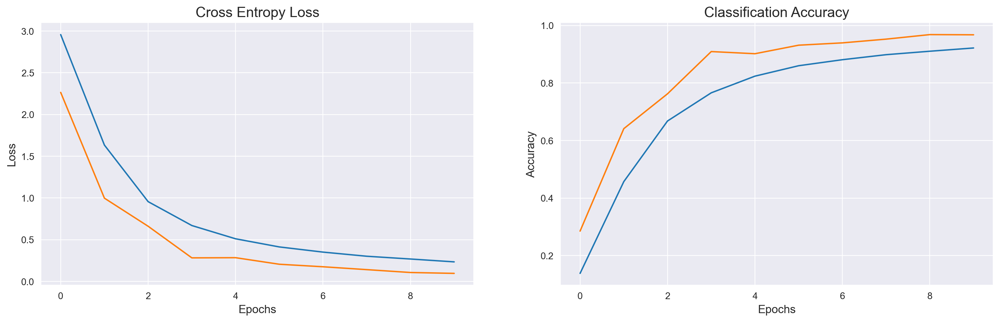

In [17]:
# plots for accuracy and Loss with epochs

error = pd.DataFrame(history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [9]:
# prediction
result = model.predict(test_data,verbose = 0)

y_pred = np.argmax(result, axis = 1)

y_true = test_data.labels

# Evaluvate
loss,acc = model.evaluate(test_data,verbose = 0)

print('The accuracy of the model for testing data is:',acc*100)
print('The Loss of the model for testing data is:',loss)

The accuracy of the model for testing data is: 96.35632038116455
The Loss of the model for testing data is: 0.10524008423089981


In [10]:

p = y_pred
y = y_true
correct = np.nonzero(p==y)[0]
incorrect = np.nonzero(p!=y)[0]

print("Correct predicted classes:",correct.shape[0])
print("Incorrect predicted classes:",incorrect.shape[0])

Correct predicted classes: 8375
Incorrect predicted classes: 325


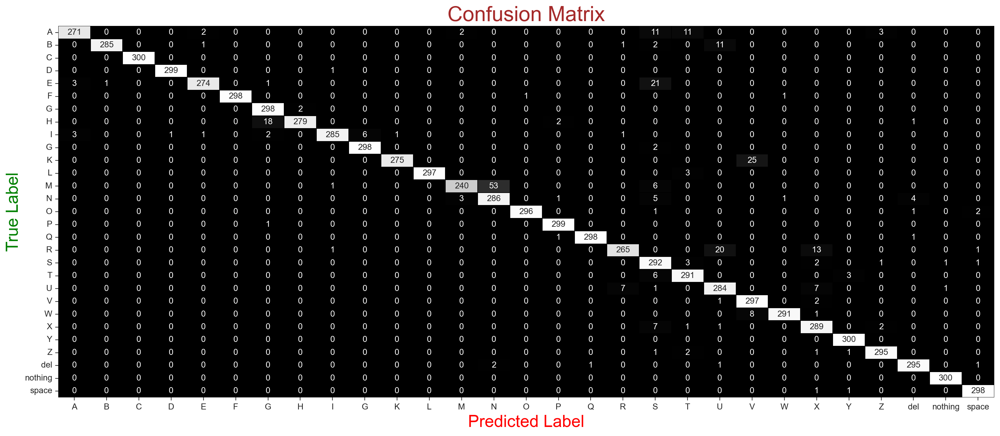

In [11]:
sns.set_style('ticks')

confusion_mtx = confusion_matrix(y_true,y_pred) 

f,ax = plt.subplots(figsize = (20,8),dpi=200)

sns.heatmap(confusion_mtx, annot=True, 
            linewidths=0.1, cmap = "gist_yarg_r", 
            linecolor="black", fmt='.0f', ax=ax, 
            cbar=False, xticklabels=categories.values(), 
            yticklabels=categories.values())

plt.xlabel("Predicted Label",fontdict={'color':'red','size':20})
plt.ylabel("True Label",fontdict={'color':'green','size':20})
plt.title("Confusion Matrix",fontdict={'color':'brown','size':25})

plt.show()

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from keras.models import load_model
import numpy as np

model = load_model('C:/django/TheSilentVoice-signlanguagerecognition/signlanguage/model/ASLmodel.h5')
labels = ["A", "B", "C", "D", "E", "F", "G", "H", "I", "G", "K", "L", "M", "N", "O", "P", "Q", "R", "S", "T", "U", "V", "W", "X", "Y", "Z", "del", "nothing", "space"]


In [14]:
img_path = "C:/Users/Dell/OneDrive/Desktop/o.jpg"
img = image.load_img(img_path, target_size=(100, 100))  # Adjust target_size as per your model's input size
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0  # Normalize the image data if necessary

In [15]:
predictions = model.predict(img_array)


1/1 [==============================] - 0s 60ms/step


In [16]:
predicted_class_index = np.argmax(predictions, axis=1)[0]

# Get the class label associated with the predicted index
predicted_class_label = labels[predicted_class_index]
print("Predicted class:", predicted_class_label)

Predicted class: O


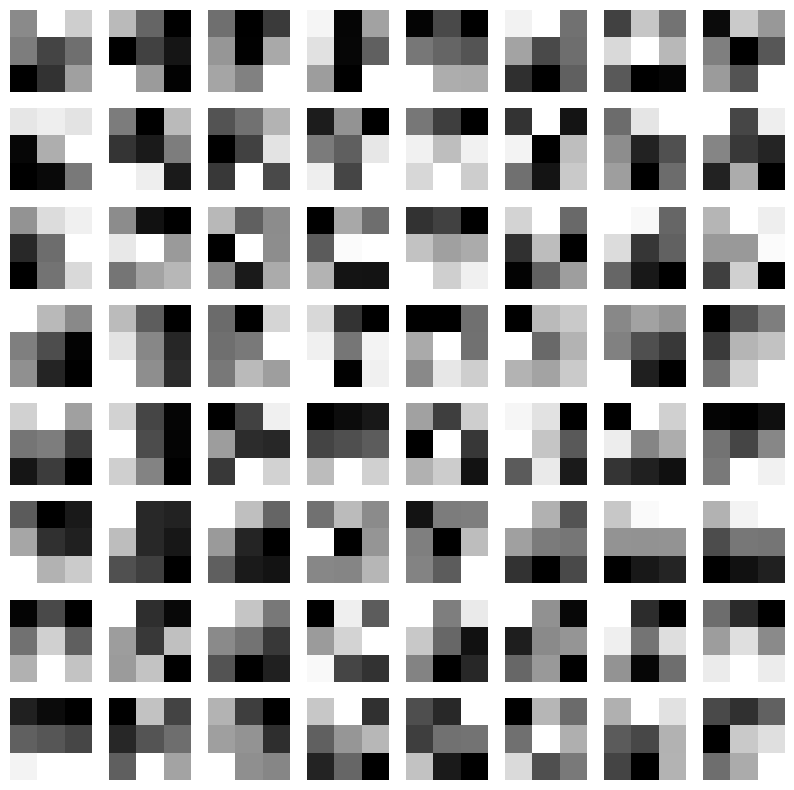

In [2]:
# Get the weights of the first convolutional layer
first_layer_weights = model.layers[0].get_weights()[0]

# Visualize filters
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
for i in range(64):  # Assuming 64 filters in the first convolutional layer
    plt.subplot(8, 8, i+1)
    plt.imshow(first_layer_weights[:, :, 0, i], cmap='gray')
    plt.axis('off')
plt.show()


1/1 [==============================] - 0s 159ms/step


C:\Users\Dell\AppData\Local\Temp\ipykernel_13452\1084863399.py:38: RuntimeWarning: invalid value encountered in divide
  channel_image /= channel_image.std()


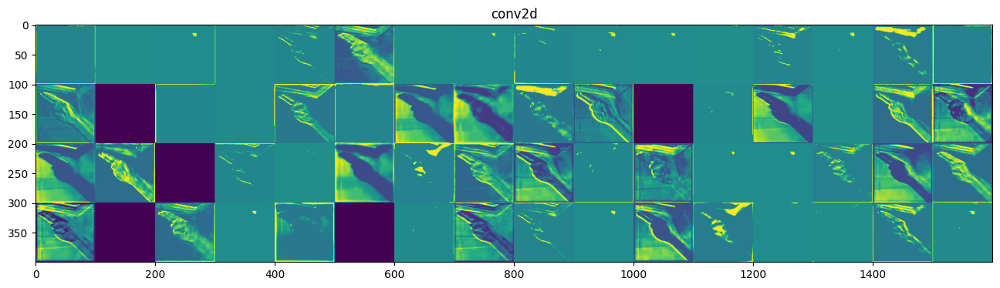

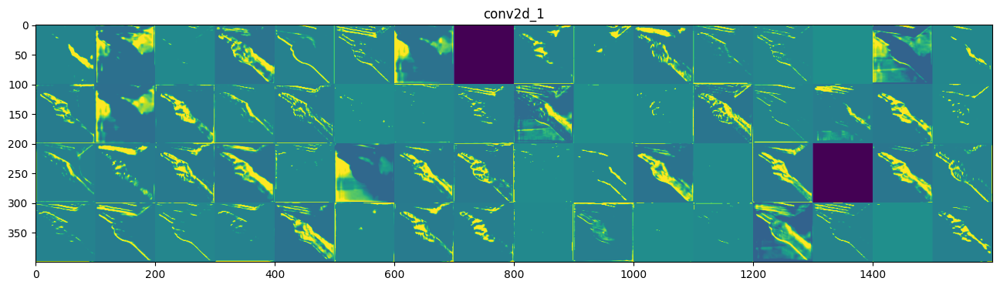

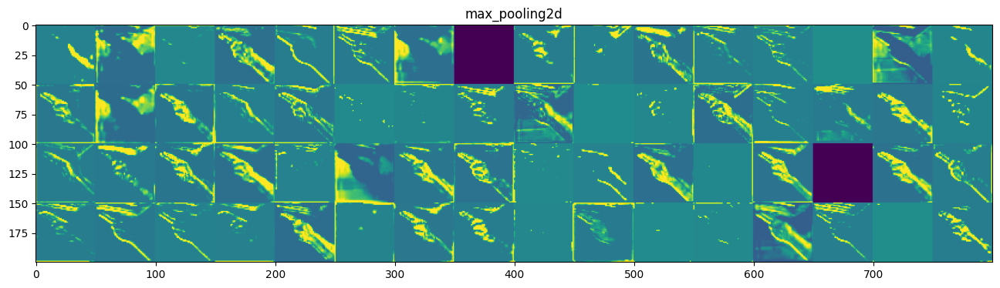

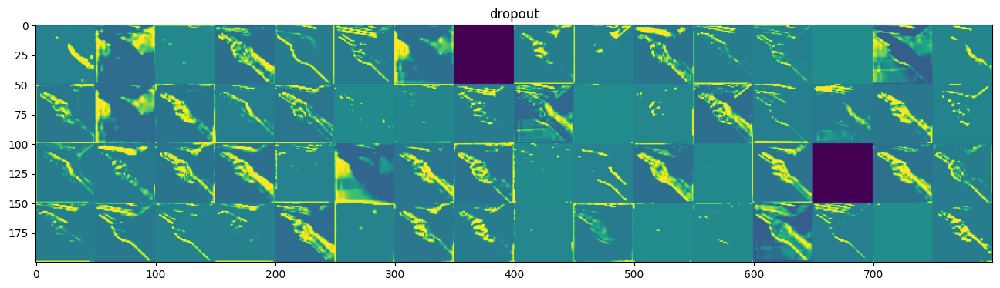

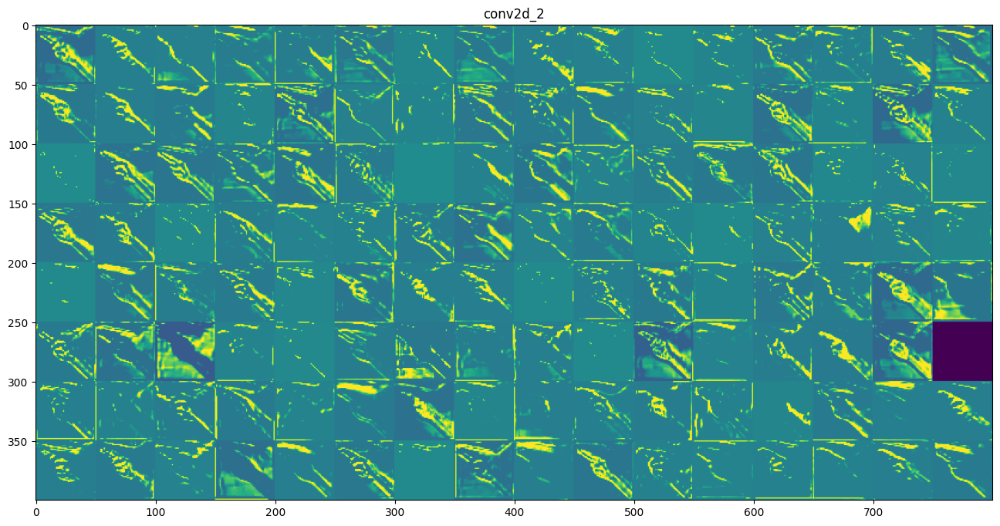

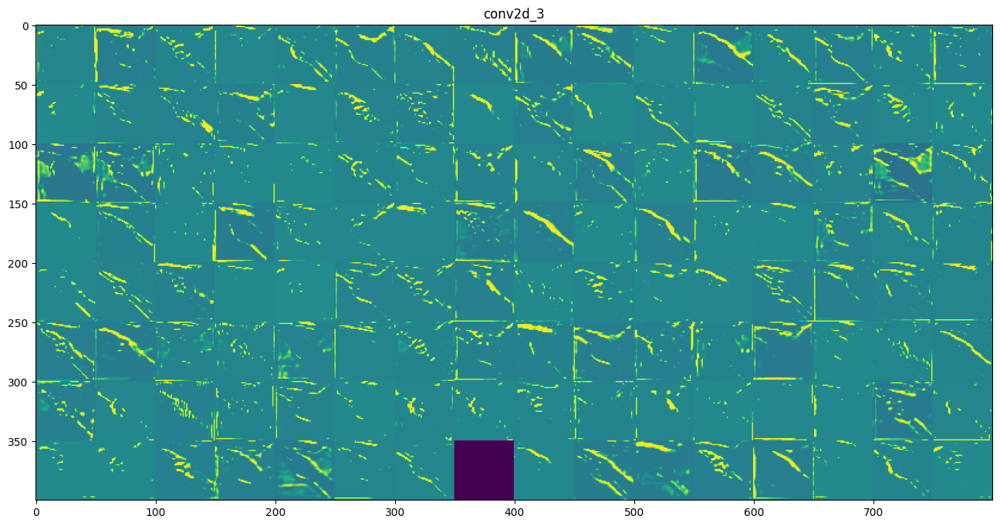

In [8]:
import cv2
import numpy as np
from keras.models import Model

# Load the image using OpenCV
image_path = 'c:/Users/Dell/Downloads/ASLdatasets/train/H/H1008.jpg'  # Replace with the path to your image
input_image = cv2.imread(image_path)
input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Preprocess the image (resize, normalize, etc.) to match the model input requirements
image_size = 100 # Replace with the required image size for your model
input_image = cv2.resize(input_image, (image_size, image_size))
input_image = input_image.astype('float32') / 255.0  # Normalize pixel values

# Reshape the image to match the model input shape
input_image = input_image.reshape(1, image_size, image_size, 3)  # Assuming 3 channels (RGB)

# Define the activation model to get intermediate layer outputs
layer_outputs = [layer.output for layer in model.layers[:6]]  # Extracting feature maps up to the 6th layer
activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(input_image)

# Visualize the activations
layer_names = [layer.name for layer in model.layers[:6]]
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]  # Number of features in the feature map
    size = layer_activation.shape[1]  # Size of the feature map

    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()


In [9]:
import cv2
import os

# Path to your dataset directory containing images
dataset_dir = 'C:/Users/Dell/Downloads/ASLdatasets/'

# Output directory to save black and white images
output_dir = 'C:/Users/Dell/Downloads/GSASLdatasets'
os.makedirs(output_dir, exist_ok=True)

# Iterate through each image in the dataset directory
for filename in os.listdir(dataset_dir):
    if filename.endswith(('.jpg', '.jpeg', '.png')):  # Select file types (adjust as needed)
        # Read the image using OpenCV
        img_path = os.path.join(dataset_dir, filename)
        image = cv2.imread(img_path)
        
        # Convert the image to grayscale
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        
        # Save the black and white image
        output_path = os.path.join(output_dir, f"bw_{filename}")  # Save with a new name
        cv2.imwrite(output_path, gray_image)
